In [175]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Doing Descriptive Analisys

In [176]:
df = pd.read_csv('winequality-red.csv') #Importing dataset
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [177]:
df.quality = df.quality.astype(float) # Transforming dtype of quality column

In [178]:
df.info() # Taking Info about data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   float64
dtypes: float64(12)
memory usage: 150.0 KB


In [179]:
df.quality.describe() # Describing quality column

count    1599.000000
mean        5.636023
std         0.807569
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         8.000000
Name: quality, dtype: float64

In [180]:
quality_bool = [] # Creating a bool object

In [181]:
# Loop for to append values to quality_bool
for i in df.quality.iteritems():
    value = (i[1])
    if value >= 6.5:
        quality_bool.append(1)
    else:
        quality_bool.append(0)

In [182]:
df['quality_bool'] = quality_bool # Putting the Column in Data Frame

In [183]:
df.quality_bool.value_counts() # Understanding the comportament of my data

0    1382
1     217
Name: quality_bool, dtype: int64

In [184]:
#Importing ProfileReport to help on Descriptive Analisys
from pandas_profiling import ProfileReport 

In [185]:
profile = ProfileReport(df, title='Relatory of Red Wine Quality', html={'style':{'full_width':True}})

In [186]:
profile

In [187]:
profile.to_file(output_file="redwine_quality.html") #Dowloading the relatory

##### Cleaning Data

In [188]:
df.duplicated() # Finding duplicated rows

0       False
1       False
2       False
3       False
4        True
        ...  
1594    False
1595    False
1596     True
1597    False
1598    False
Length: 1599, dtype: bool

In [189]:
df_without_duplicates = df.drop_duplicates() # Creating othes Data Frame withour duplicated rows

In [190]:
# Comparing Data Frames
df.info()
df_without_duplicates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   float64
 12  quality_bool          1599 non-null   int64  
dtypes: float64(12), int64(1)
memory usage: 162.5 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 0 to 1598
D

In [191]:
df_without_duplicates.mean()

fixed acidity            8.310596
volatile acidity         0.529478
citric acid              0.272333
residual sugar           2.523400
chlorides                0.088124
free sulfur dioxide     15.893304
total sulfur dioxide    46.825975
density                  0.996709
pH                       3.309787
sulphates                0.658705
alcohol                 10.432315
quality                  5.623252
quality_bool             0.135394
dtype: float64

In [192]:
df_without_duplicates = df_without_duplicates.rename(columns={'citric acid': 'citric_acid'})
df_without_duplicates.head()

,fixed acidity,volatile acidity,citric_acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_bool
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0,0
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5.0,0


In [193]:
df_without_duplicates['citric_acid'].mean()

0.2723325974981604

In [194]:
df_without_duplicates['citric_acid'][df_without_duplicates.citric_acid > 0].mean()

0.2982272360999194

In [195]:
df_without_duplicates.loc[df_without_duplicates.citric_acid == 0, 'citric_acid'] = 0.29535787321063395

In [196]:
df_without_duplicates.head()

,fixed acidity,volatile acidity,citric_acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_bool
0,7.4,0.70,0.295358,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0,0
1,7.8,0.88,0.295358,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0,0
2,7.8,0.76,0.040000,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0,0
3,11.2,0.28,0.560000,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0,0
5,7.4,0.66,0.295358,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5.0,0


##### Plotting some graphics to understand the data

<AxesSubplot:xlabel='quality', ylabel='fixed acidity'>

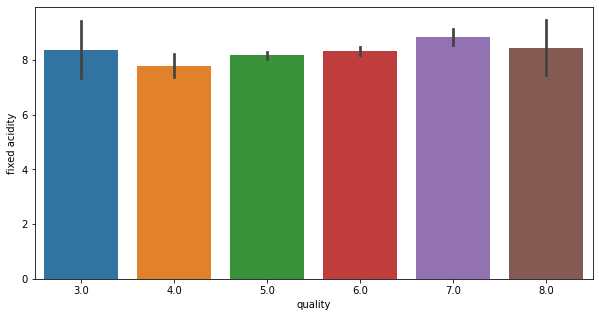

In [197]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'fixed acidity', data = df_without_duplicates)
# IRRELEVANT

<AxesSubplot:xlabel='quality', ylabel='volatile acidity'>

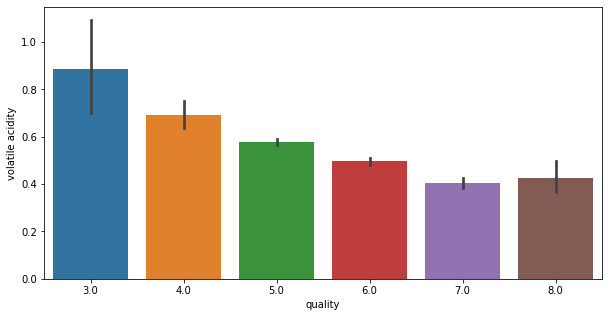

In [198]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'volatile acidity', data = df_without_duplicates)
# THE LESS VOLATILE ACIDITY BETTER

<AxesSubplot:xlabel='quality', ylabel='citric_acid'>

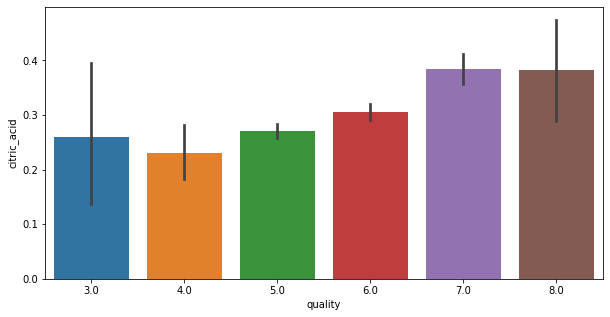

In [199]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'citric_acid', data = df_without_duplicates)
# THE MORE CITRIC ACID BETTER

<AxesSubplot:xlabel='quality', ylabel='residual sugar'>

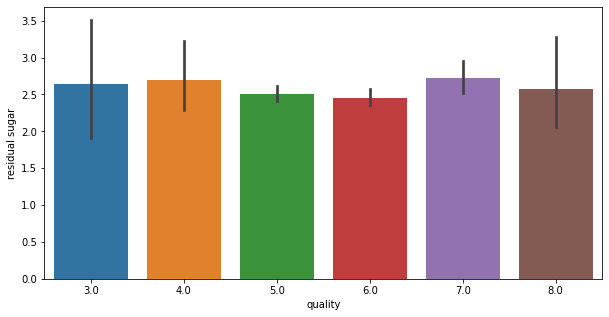

In [200]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'residual sugar', data = df_without_duplicates)
# IRRELEVANT

<AxesSubplot:xlabel='quality', ylabel='chlorides'>

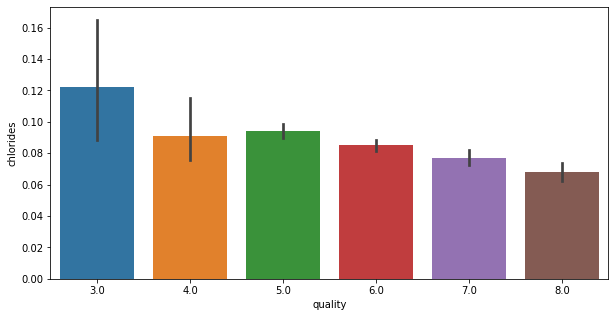

In [201]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'chlorides', data = df_without_duplicates)
# THE LESS CHLORIDES BETTER

<AxesSubplot:xlabel='quality', ylabel='total sulfur dioxide'>

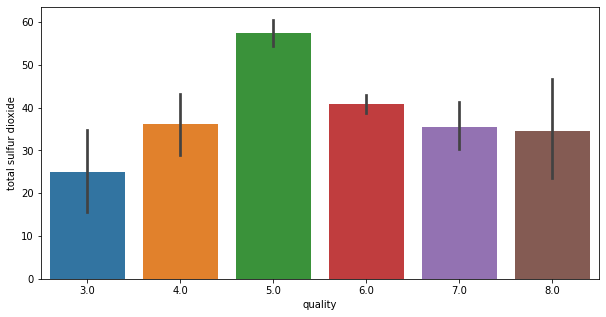

In [202]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'total sulfur dioxide', data = df_without_duplicates)
# FOLLOW THE NORMAL CURVE

<AxesSubplot:xlabel='quality', ylabel='density'>

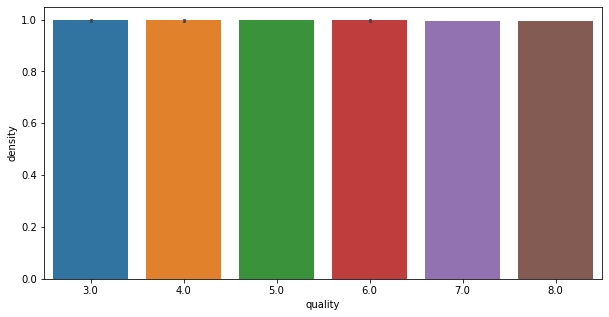

In [203]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'density', data = df_without_duplicates)
# IRRELEVANT

<AxesSubplot:xlabel='quality', ylabel='pH'>

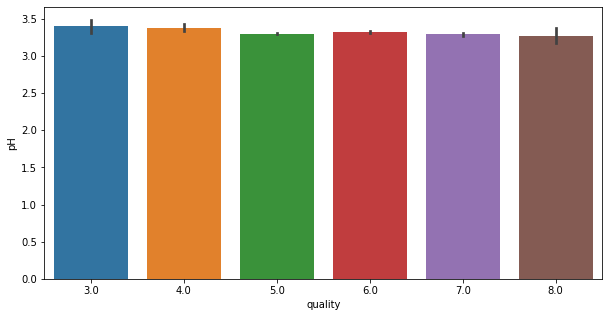

In [204]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'pH', data = df_without_duplicates)
# IRRELEVANT

<AxesSubplot:xlabel='quality', ylabel='sulphates'>

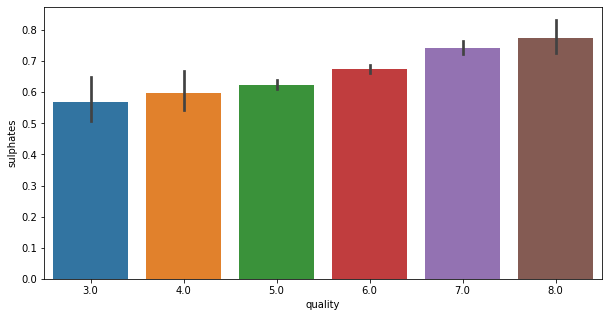

In [205]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'sulphates', data = df_without_duplicates)
# THE MORE SULFATE BETTER

<AxesSubplot:xlabel='quality', ylabel='alcohol'>

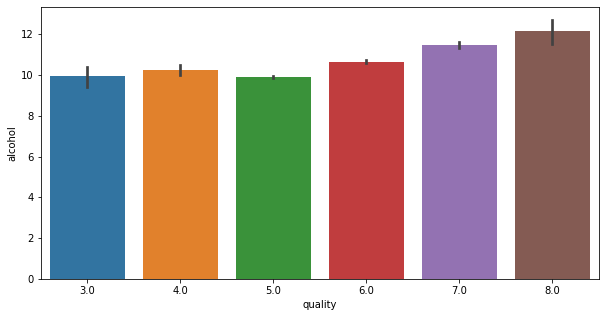

In [206]:
fig = plt.figure(figsize = (10,5))
sns.barplot(x = 'quality', y = 'alcohol', data = df_without_duplicates)
# THE MORE ALCOHOL BETTER

# Machine Lerning

In [207]:
df_without_duplicates.head()

,fixed acidity,volatile acidity,citric_acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_bool
0,7.4,0.70,0.295358,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0,0
1,7.8,0.88,0.295358,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0,0
2,7.8,0.76,0.040000,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0,0
3,11.2,0.28,0.560000,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0,0
5,7.4,0.66,0.295358,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5.0,0


In [208]:
# Deleting the columns that I will not use
X = df_without_duplicates.drop(['fixed acidity', 'residual sugar', 'density', 'pH', 'quality', 'quality_bool'], axis = 1)

In [209]:
X.head()

,volatile acidity,citric_acid,chlorides,free sulfur dioxide,total sulfur dioxide,sulphates,alcohol
0,0.70,0.295358,0.076,11.0,34.0,0.56,9.4
1,0.88,0.295358,0.098,25.0,67.0,0.68,9.8
2,0.76,0.040000,0.092,15.0,54.0,0.65,9.8
3,0.28,0.560000,0.075,17.0,60.0,0.58,9.8
5,0.66,0.295358,0.075,13.0,40.0,0.56,9.4


In [210]:
# Defining my y axis
y = df_without_duplicates['quality_bool']

In [211]:
y.head()

0    0
1    0
2    0
3    0
5    0
Name: quality_bool, dtype: int64

In [212]:
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split

In [213]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 123)

In [214]:
# Creating a DummyClassier to use like a baseline
dummy = DummyClassifier(strategy='uniform', random_state=123)
dummy.fit(X_train, y_train)

DummyClassifier(random_state=123, strategy='uniform')

In [215]:
# Our baseline
dummy_baseline = dummy.score(X_test, y_test)

In [216]:
# Creating the variable to scale our data
sc = StandardScaler()

In [217]:
# Scaling and fitting our data
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

## Testing Models

##### Testing Random Forest Classifier

In [218]:
from sklearn.ensemble import RandomForestClassifier

In [219]:
rfc = RandomForestClassifier( random_state = 123)
rfc.fit(X_train, y_train)
pred_rfc = rfc.predict(X_test)

In [220]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score

In [221]:
print(classification_report(y_test, pred_rfc))
print(confusion_matrix(y_test, pred_rfc))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       239
           1       0.59      0.48      0.53        33

    accuracy                           0.90       272
   macro avg       0.76      0.72      0.74       272
weighted avg       0.89      0.90      0.89       272

[[228  11]
 [ 17  16]]


In [222]:
rfc_eval = cross_val_score(estimator = rfc, X = X_train, y = y_train, cv = 10)
rfc_eval_percent = rfc_eval.mean()*100
print(f"Random Forest Classifier without Tunning: {rfc_eval_percent}")

Random Forest Classifier without Tunning: 87.85677879714576


##### Testing Support Vector Machine

In [223]:
from sklearn.svm import SVC

In [225]:
svc = SVC(random_state = 123)
svc.fit(X_train, y_train)
pred_svc = svc.predict(X_test)

In [226]:
print(classification_report(y_test, pred_svc))
print(confusion_matrix(y_test, pred_svc))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95       239
           1       0.71      0.30      0.43        33

    accuracy                           0.90       272
   macro avg       0.81      0.64      0.69       272
weighted avg       0.89      0.90      0.88       272

[[235   4]
 [ 23  10]]


In [227]:
svc_eval = cross_val_score(estimator = svc, X = X_train, y = y_train, cv = 10)
svc_eval_percent = svc_eval.mean()*100
print(f"Support Vector Machine without Tunning: {svc_eval_percent}")

Support Vector Machine without Tunning: 88.04026503567789


## Tunning Models

##### Tunning RandomForestClassifier

In [228]:
from sklearn.model_selection import GridSearchCV, cross_val_score

In [229]:
param = { 
    'n_estimators': [100, 500],
    'criterion' :['gini', 'entropy'],
    'max_depth' : [4,5,6,7,8],
    'max_features': ['auto', 'sqrt', 'log2'],
}
grid_rfc = GridSearchCV(estimator = rfc, param_grid = param, cv = 10)
grid_rfc.fit(X_train, y_train)


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=123),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 500]})

In [230]:
grid_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 6,
 'max_features': 'auto',
 'n_estimators': 500}

In [231]:
rfc2 = RandomForestClassifier(n_estimators = 500, criterion = 'gini',
                              max_features = 'auto', max_depth = 6, random_state = 123)
rfc2.fit(X_train, y_train)
pred_rfc2 = rfc2.predict(X_test)

In [232]:
print(classification_report(y_test, pred_rfc2))
print(confusion_matrix(y_test, pred_rfc2))

              precision    recall  f1-score   support

           0       0.91      0.96      0.94       239
           1       0.55      0.33      0.42        33

    accuracy                           0.89       272
   macro avg       0.73      0.65      0.68       272
weighted avg       0.87      0.89      0.87       272

[[230   9]
 [ 22  11]]


In [233]:
rfc_eval2 = cross_val_score(estimator = rfc2, X = X_train, y = y_train, cv = 10)
rfc_eval2_percent = rfc_eval2.mean()*100
print(f"Random Forest Classifier Tunning the Model: {rfc_eval2_percent}")

Random Forest Classifier Tunning the Model: 88.40978593272173


##### Tunning Support Vector Machine

In [234]:
param = {
    'C': [0.1,0.4,0.8,0.9,1,1.1,1.4,1.6,1.8,2],
    'kernel':['linear', 'rbf'],
    'gamma' :[0.1,0.4,0.8,0.9,1,1.1,1.4,1.6,1.8,2]
}
grid_svc = GridSearchCV(svc, param_grid=param, scoring='accuracy', cv=10)

In [235]:
grid_svc.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SVC(random_state=123),
             param_grid={'C': [0.1, 0.4, 0.8, 0.9, 1, 1.1, 1.4, 1.6, 1.8, 2],
                         'gamma': [0.1, 0.4, 0.8, 0.9, 1, 1.1, 1.4, 1.6, 1.8,
                                   2],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [236]:
grid_svc.best_params_

{'C': 0.9, 'gamma': 0.4, 'kernel': 'rbf'}

In [237]:
svc2 = SVC(C = 0.9, gamma = 0.4, kernel = 'rbf', random_state = 123)
svc2.fit(X_train, y_train)
pred_svc2 = svc2.predict(X_test)
print(classification_report(y_test, pred_svc2))
print(confusion_matrix(y_test, pred_svc2))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94       239
           1       0.63      0.36      0.46        33

    accuracy                           0.90       272
   macro avg       0.77      0.67      0.70       272
weighted avg       0.88      0.90      0.88       272

[[232   7]
 [ 21  12]]


In [238]:
svc_eval2 = cross_val_score(estimator = svc2, X = X_train, y = y_train, cv = 10)
svc_eval2_percent = svc_eval2.mean()*100
print(f"Support Vector Machine Tunning the Model: {svc_eval2_percent}")

Support Vector Machine Tunning the Model: 88.77336051647978


### Choosing the best model

In [239]:
models = {'dbl': dummy_baseline,
          'rfc': rfc_eval_percent, 'rfc2': rfc_eval2_percent,
          'svc': svc_eval_percent, 'svc2': svc_eval2_percent}

In [240]:
models

{'dbl': 0.4963235294117647,
 'rfc': 87.85677879714576,
 'rfc2': 88.40978593272173,
 'svc': 88.04026503567789,
 'svc2': 88.77336051647978}

In [241]:
model_value = models[max(models, key=models.get)]
model_value

88.77336051647978